# Bank Marketing Classification

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed.\
Link to the Dataset https://archive.ics.uci.edu/dataset/222/bank+marketing \
Features: 16\
Instances: 45211\
Has Missing Values? No


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import ADASYN

### The Dataset

In [2]:
# Load the dataset
ds = pd.read_csv("bank-full.csv", delimiter=';')
ds

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


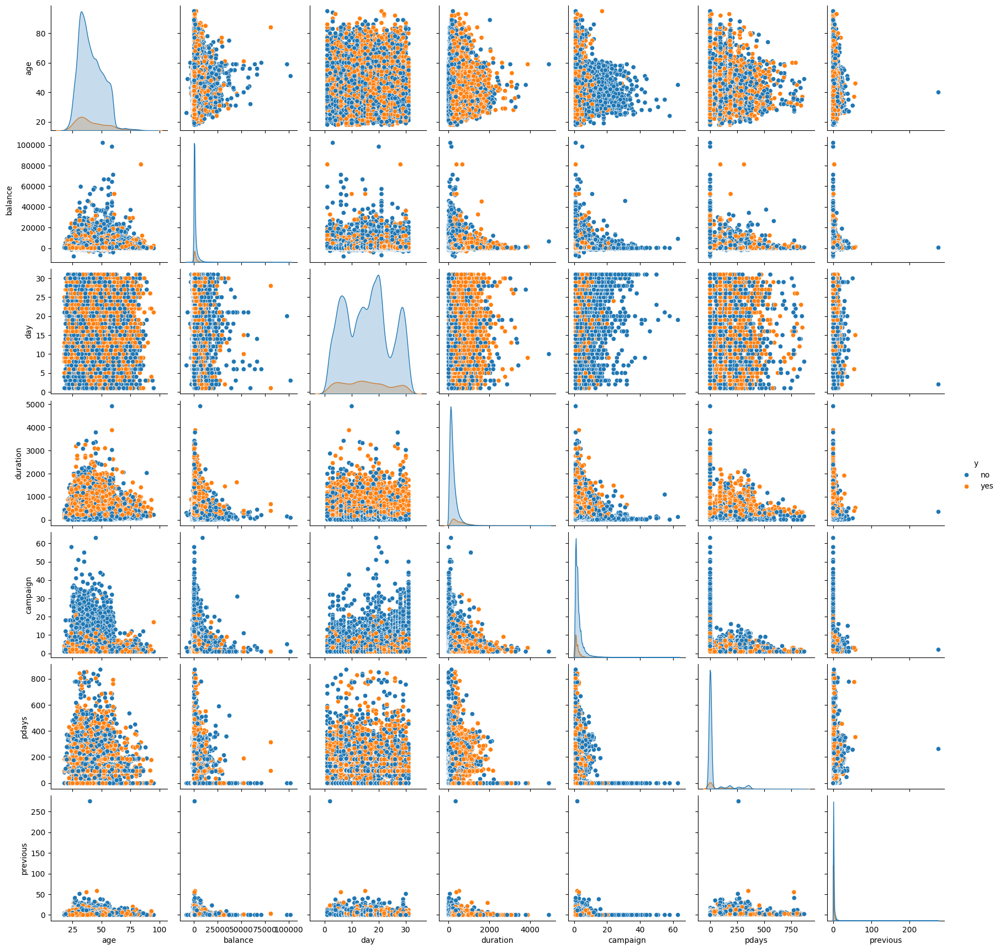

In [3]:
# Create the pair plot
sns.pairplot(ds, hue='y')

# Display the plot
plt.show()

### Box Plot

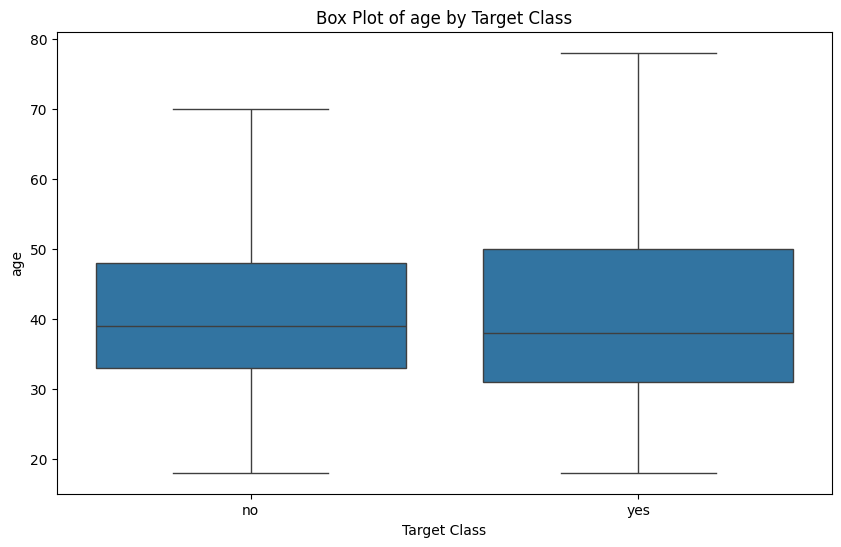

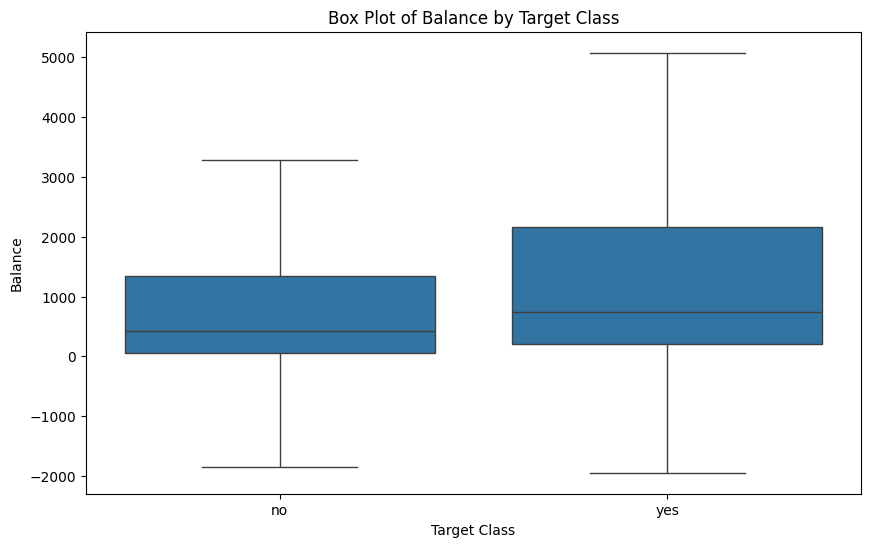

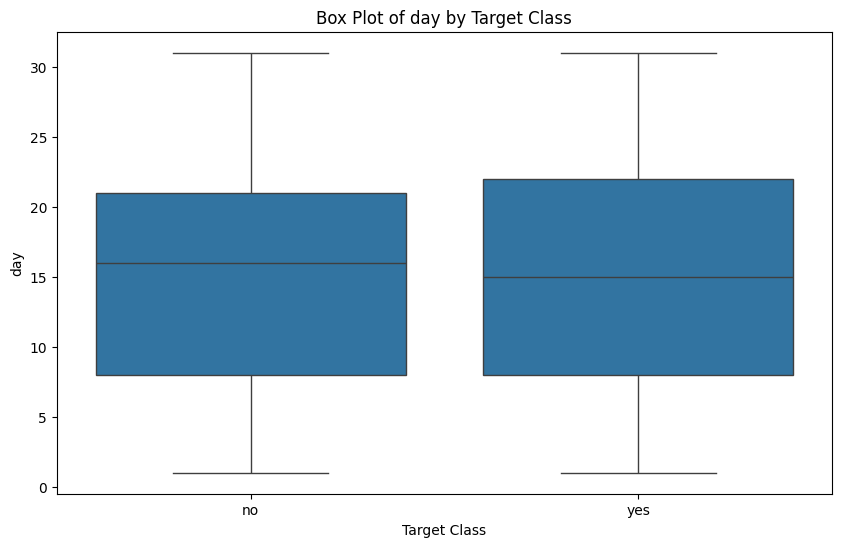

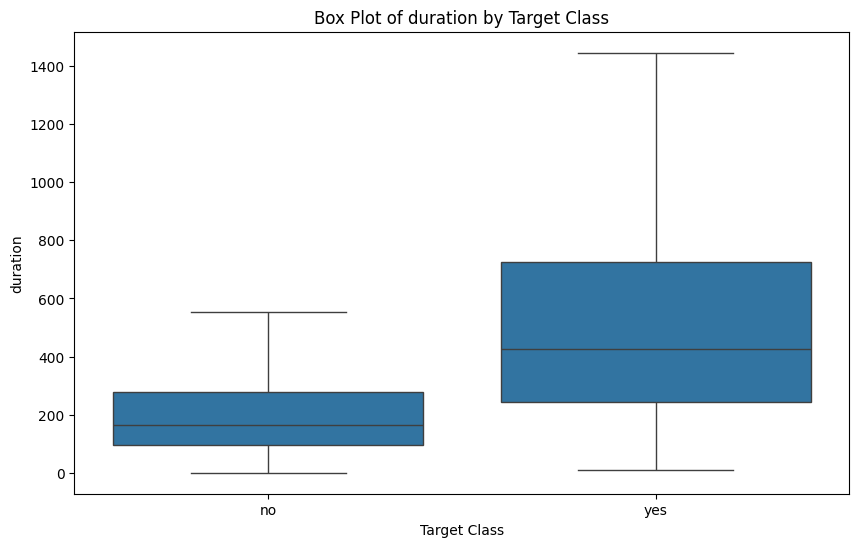

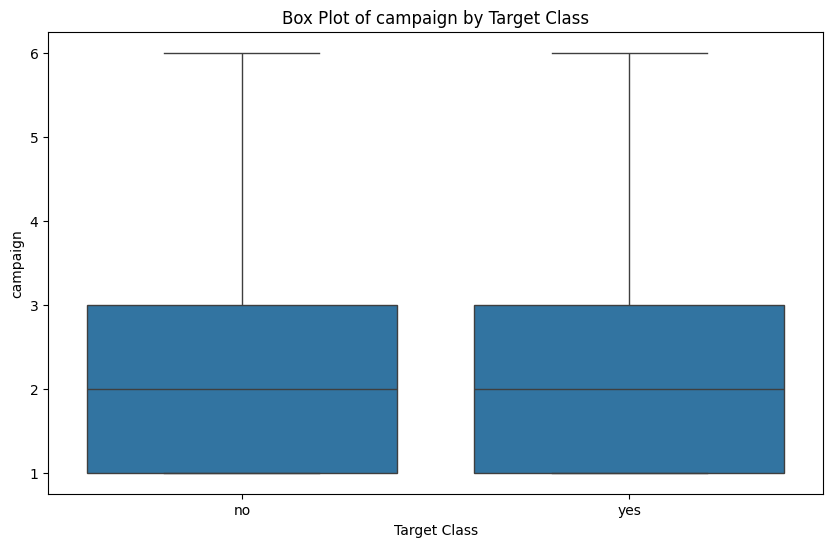

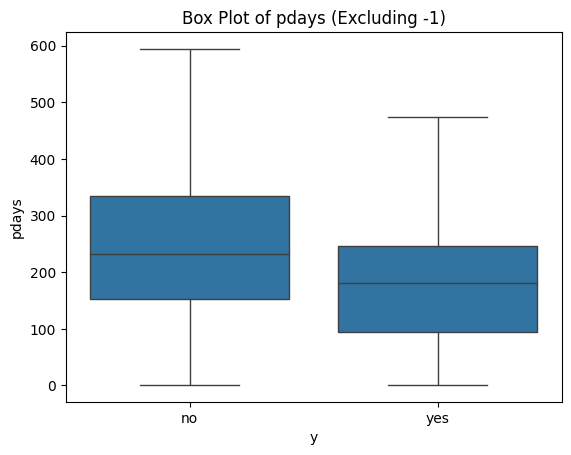

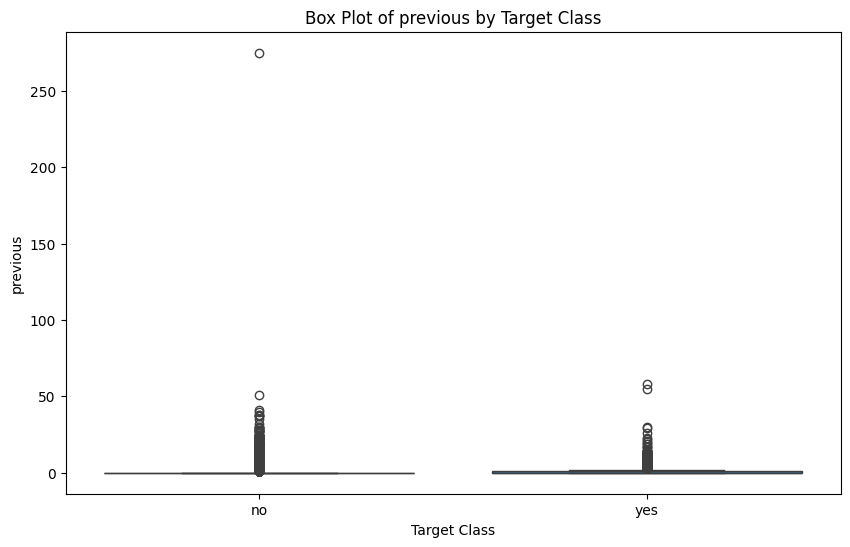

In [4]:

plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='age', data=ds, showfliers=False)  
plt.title('Box Plot of age by Target Class')
plt.ylabel('age')
plt.xlabel('Target Class')
plt.grid(False)  
plt.show()



plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='balance', data=ds, showfliers=False)  
plt.title('Box Plot of Balance by Target Class')
plt.ylabel('Balance')
plt.xlabel('Target Class')
plt.grid(False)  # Optionally remove the grid
plt.show()


plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='day', data=ds, showfliers=False)  
plt.title('Box Plot of day by Target Class')
plt.ylabel('day')
plt.xlabel('Target Class')
plt.grid(False)  
plt.show()


plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='duration', data=ds, showfliers=False)  
plt.title('Box Plot of duration by Target Class')
plt.ylabel('duration')
plt.xlabel('Target Class')
plt.grid(False)  
plt.show()



plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='campaign', data=ds, showfliers=False)  
plt.title('Box Plot of campaign by Target Class')
plt.ylabel('campaign')
plt.xlabel('Target Class')
plt.grid(False)  
plt.show()



sns.boxplot(x='y', y='pdays', data=ds[ds['pdays'] != -1], showfliers=False)
plt.title('Box Plot of pdays (Excluding -1)')
plt.show()



plt.figure(figsize=(10, 6))
sns.boxplot(x='y', y='previous', data=ds, showfliers=True)  
plt.title('Box Plot of previous by Target Class')
plt.ylabel('previous')
plt.xlabel('Target Class')
plt.grid(False)  
plt.show()

## Scatter Plot

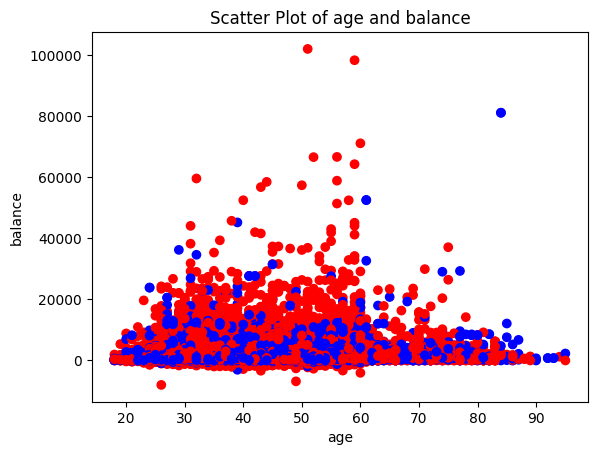

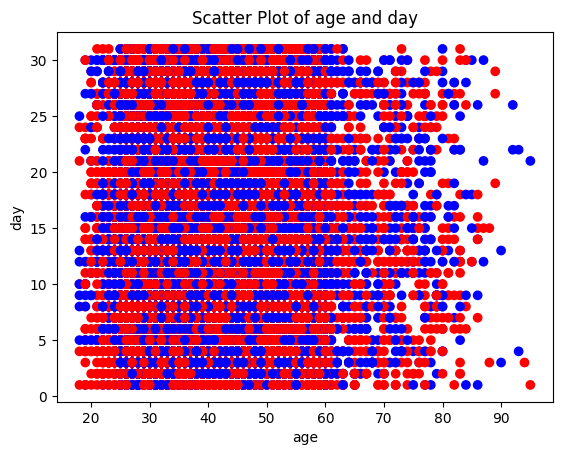

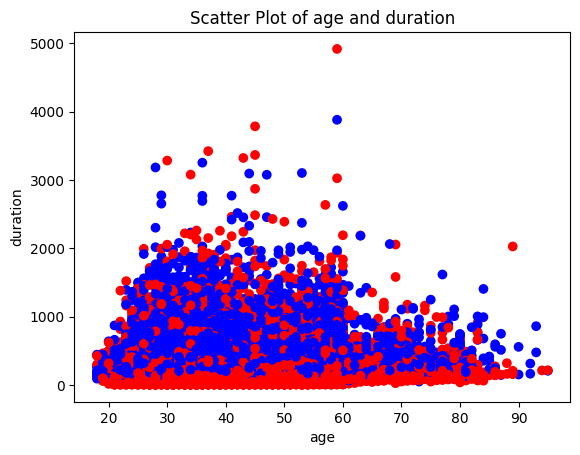

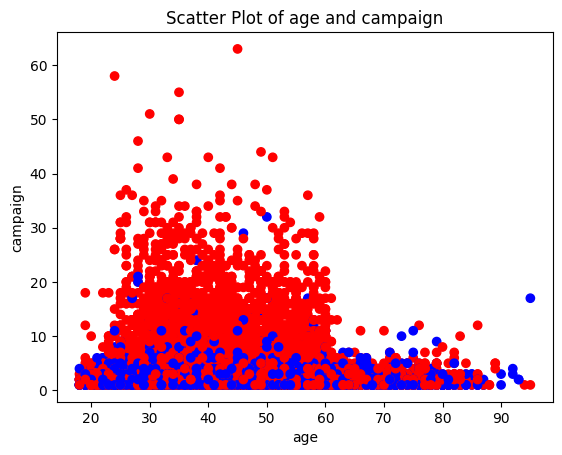

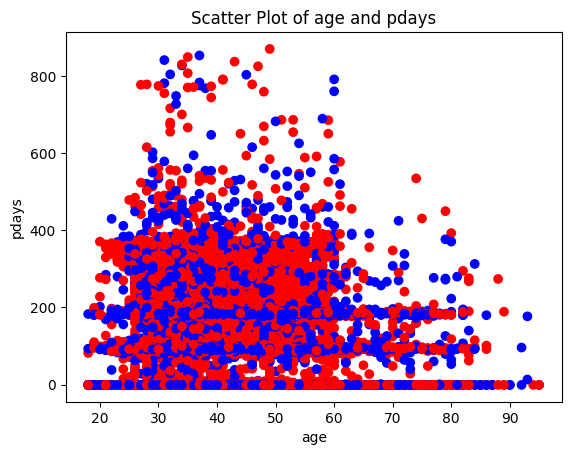

...

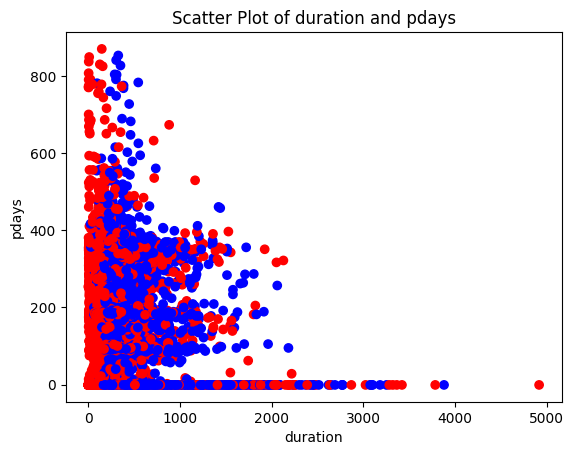

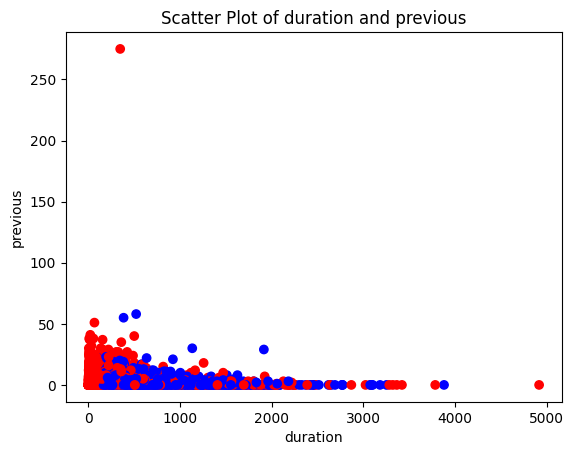

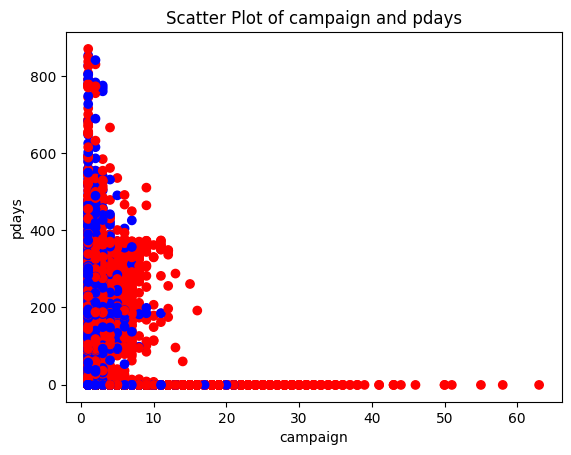

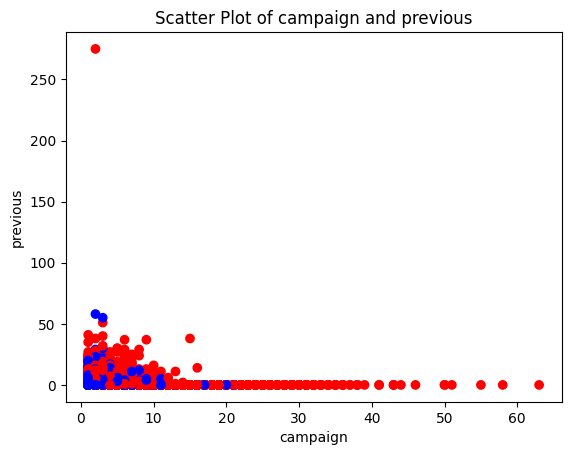

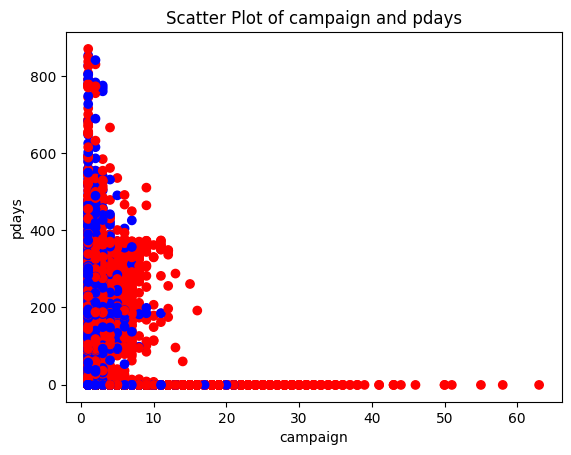

In [5]:
# age and balance
x = ds['age']
y = ds['balance']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
# Create scatter plot
plt.scatter(x, y, c=color)
# Adding labels and title
plt.xlabel('age')
plt.ylabel('balance')
plt.title('Scatter Plot of age and balance')
# Show plot
plt.show()


x = ds['age']
y = ds['day']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('age')
plt.ylabel('day')
plt.title('Scatter Plot of age and day')
plt.show()



x = ds['age']
y = ds['duration']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('age')
plt.ylabel('duration')
plt.title('Scatter Plot of age and duration')
plt.show()




x = ds['age']
y = ds['campaign']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('age')
plt.ylabel('campaign')
plt.title('Scatter Plot of age and campaign')
plt.show()


x = ds['age']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('age')
plt.ylabel('pdays')
plt.title('Scatter Plot of age and pdays')
plt.show()



x = ds['age']
y = ds['previous']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('age')
plt.ylabel('previous')
plt.title('Scatter Plot of age and previous')
plt.show()



x = ds['balance']
y = ds['day']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('balance')
plt.ylabel('day')
plt.title('Scatter Plot of balance and day')
plt.show()


x = ds['balance']
y = ds['duration']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('balance')
plt.ylabel('duration')
plt.title('Scatter Plot of balance and duration')
plt.show()



x = ds['balance']
y = ds['campaign']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('balance')
plt.ylabel('campaign')
plt.title('Scatter Plot of balance and campaign')
plt.show()


x = ds['balance']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('balance')
plt.ylabel('pdays')
plt.title('Scatter Plot of balance and pdays')
plt.show()


x = ds['balance']
y = ds['previous']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('balance')
plt.ylabel('previous')
plt.title('Scatter Plot of balance and previous')
plt.show()



x = ds['day']
y = ds['duration']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('day')
plt.ylabel('duration')
plt.title('Scatter Plot of day and duration')
plt.show()


x = ds['day']
y = ds['campaign']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('day')
plt.ylabel('campaign')
plt.title('Scatter Plot of day and campaign')
plt.show()


x = ds['day']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('day')
plt.ylabel('pdays')
plt.title('Scatter Plot of day and pdays')
plt.show()


x = ds['day']
y = ds['previous']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('day')
plt.ylabel('previous')
plt.title('Scatter Plot of day and previous')
plt.show()



x = ds['duration']
y = ds['campaign']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('duration')
plt.ylabel('campaign')
plt.title('Scatter Plot of duration and campaign')
plt.show()


x = ds['duration']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('duration')
plt.ylabel('pdays')
plt.title('Scatter Plot of duration and pdays')
plt.show()


x = ds['duration']
y = ds['previous']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('duration')
plt.ylabel('previous')
plt.title('Scatter Plot of duration and previous')
plt.show()



x = ds['campaign']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('campaign')
plt.ylabel('pdays')
plt.title('Scatter Plot of campaign and pdays')
plt.show()


x = ds['campaign']
y = ds['previous']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('campaign')
plt.ylabel('previous')
plt.title('Scatter Plot of campaign and previous')
plt.show()



x = ds['campaign']
y = ds['pdays']
color = ds['y'].apply(lambda val: 'blue' if val == 'yes' else 'red')
plt.scatter(x, y, c=color)
plt.xlabel('campaign')
plt.ylabel('pdays')
plt.title('Scatter Plot of campaign and pdays')
plt.show()


## HeatMap

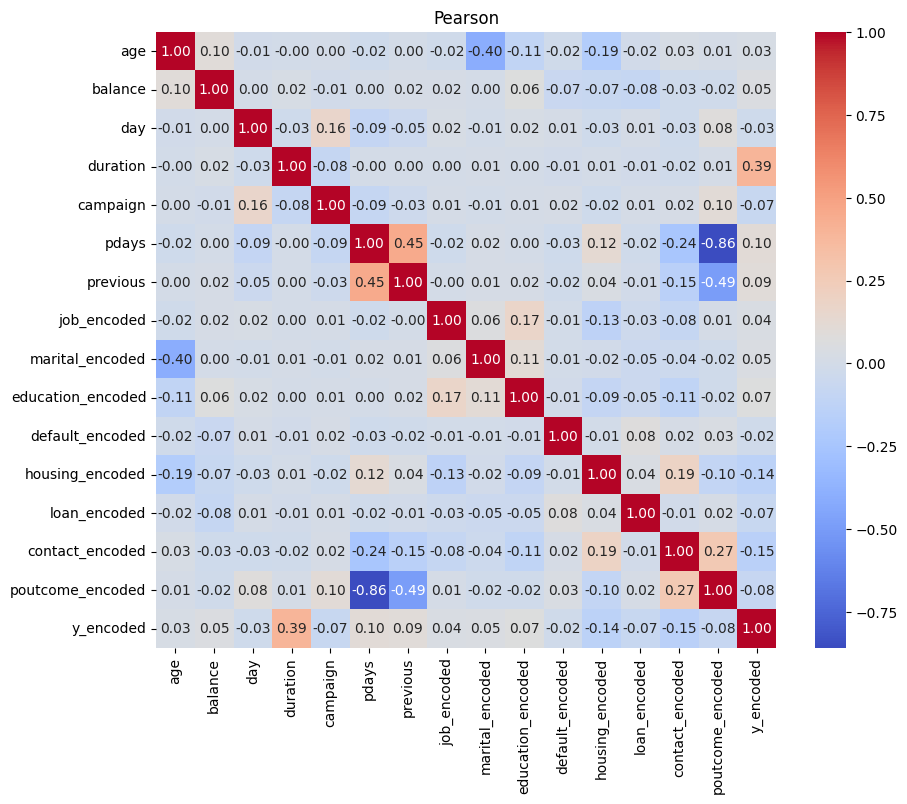

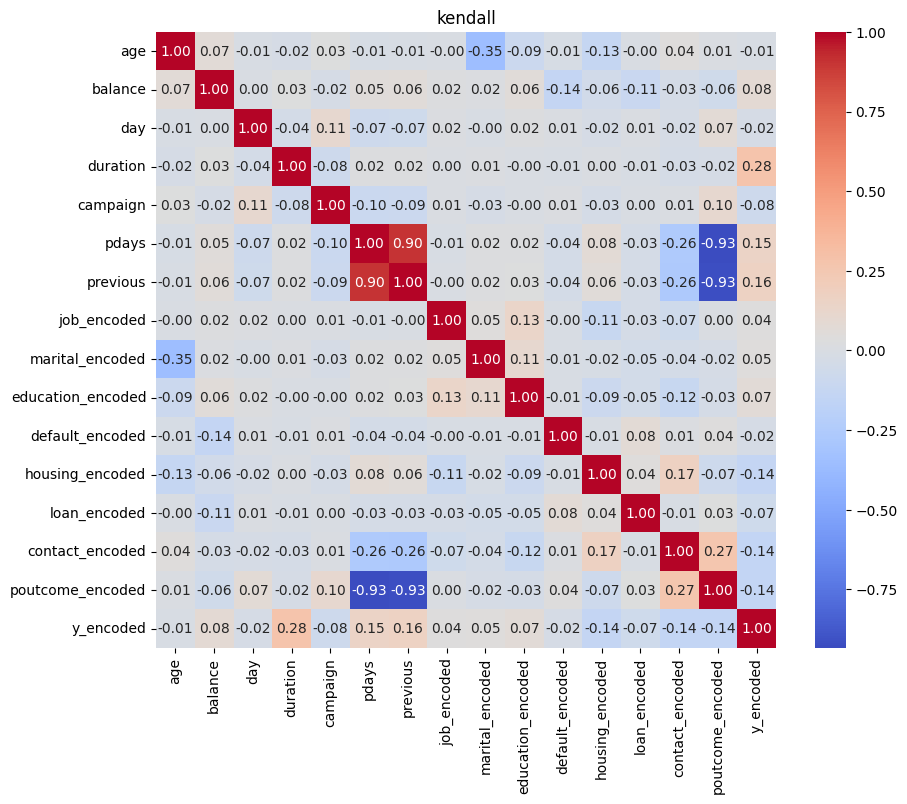

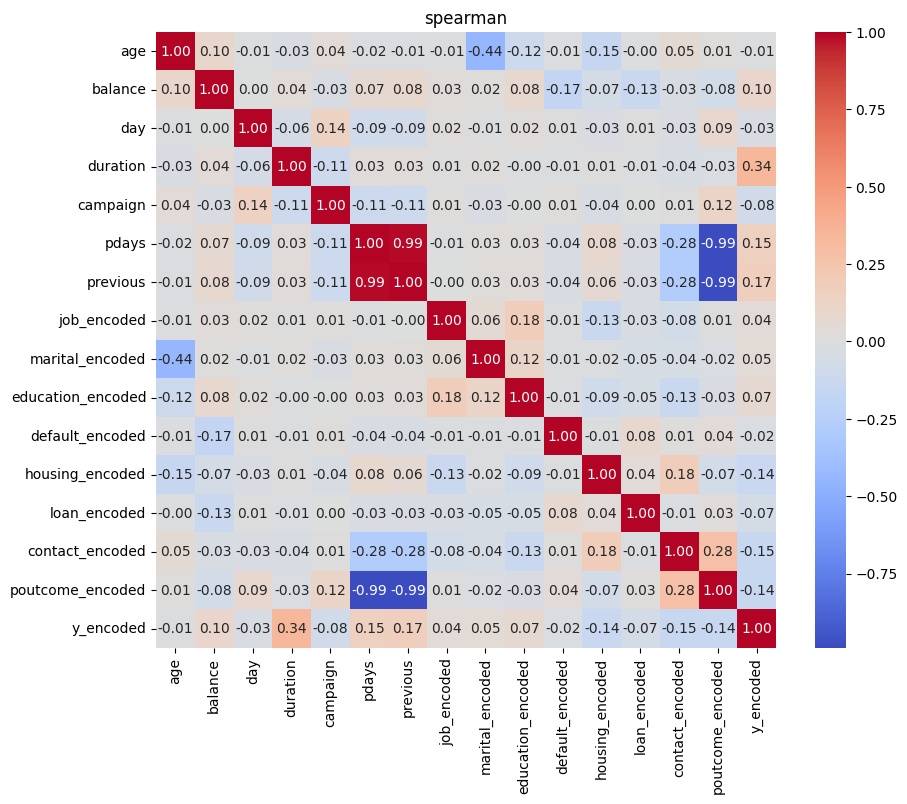

In [6]:
# Label encode the categorical columns
label_encoder = LabelEncoder()
ds['job_encoded'] = label_encoder.fit_transform(ds['job'])
ds['marital_encoded'] = label_encoder.fit_transform(ds['marital'])
ds['education_encoded'] = label_encoder.fit_transform(ds['education'])
ds['default_encoded'] = label_encoder.fit_transform(ds['default'])
ds['housing_encoded'] = label_encoder.fit_transform(ds['housing'])
ds['loan_encoded'] = label_encoder.fit_transform(ds['loan'])
ds['contact_encoded'] = label_encoder.fit_transform(ds['contact'])
ds['poutcome_encoded'] = label_encoder.fit_transform(ds['poutcome'])
ds['y_encoded'] = label_encoder.fit_transform(ds['y'])



# Include all numeric columns, including the encoded ones
numeric_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous', 
                'job_encoded', 'marital_encoded','education_encoded', 'default_encoded', 
                'housing_encoded', 'loan_encoded', 'contact_encoded', 'poutcome_encoded','y_encoded']


pearson_corr = ds[numeric_cols].corr(method='pearson')  # Default method
kendall_corr = ds[numeric_cols].corr(method='kendall')
spearman_corr = ds[numeric_cols].corr(method='spearman')


# Draw the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pearson_corr, annot=True, fmt='.2f', cmap='coolwarm')
# Add title and labels
plt.title('Pearson')
plt.show()


# Draw the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(kendall_corr, annot=True, fmt='.2f', cmap='coolwarm')
# Add title and labels
plt.title('kendall')
plt.show()


# Draw the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(spearman_corr, annot=True, fmt='.2f', cmap='coolwarm')
# Add title and labels
plt.title('spearman')
plt.show()

## Split data, Feature Scaling and Normalization

In [7]:
# Select features and target variable
# x = ds[['age','duration', 'campaign', 'pdays', 'previous','contact_encoded', 'poutcome_encoded']]
x = ds[['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'job_encoded',
       'education_encoded', 'housing_encoded', 'poutcome_encoded']]
y = ds['y_encoded']


numeric_col = ds[['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous', 
                'job_encoded', 'marital_encoded','education_encoded', 'default_encoded', 
                'housing_encoded', 'loan_encoded', 'contact_encoded', 'poutcome_encoded']]

# Splitting the data (25% for testing, 75% for training)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=1)

# Feature Scaling
sc = StandardScaler()
x_train_scale = sc.fit_transform(x_train)
x_test_scale = sc.transform(x_test)



Selected Features: Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'job_encoded',
       'education_encoded', 'housing_encoded', 'poutcome_encoded'],
      dtype='object')


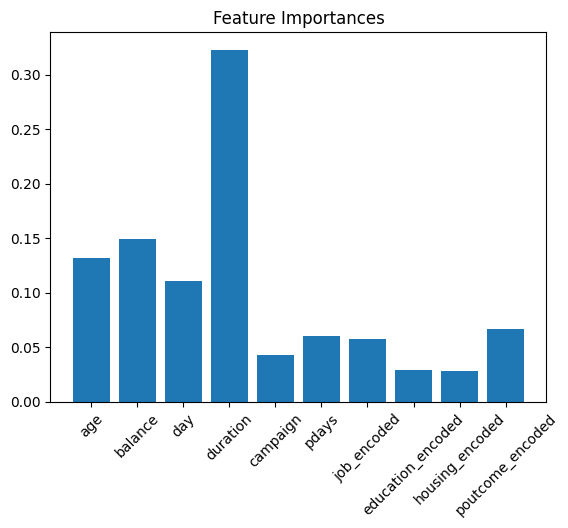

In [8]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# Initialize the model
model = RandomForestClassifier(random_state=42)

# RFE Feature Selector
rfe = RFE(model, n_features_to_select=10)
rfe.fit(numeric_col, y)

# Selected Features
selected_features = numeric_col.columns[rfe.support_]
print("Selected Features:", selected_features)

# Access the trained Random Forest model from RFE
fitted_model = rfe.estimator_

# Feature Importances
importances = fitted_model.feature_importances_
plt.bar(selected_features, importances)
plt.title("Feature Importances")
plt.xticks(rotation=45)
plt.show()


## KNN Prediction

F1 Score: 0.4217347956131605
accuracy =  0.8973723790144209


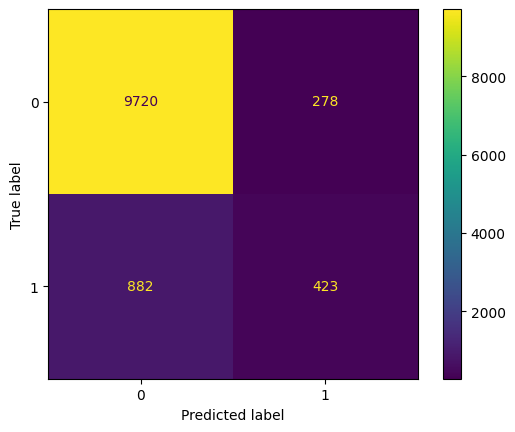

In [9]:
# Training the K-NN model on the Training set
KNN_classifier = KNeighborsClassifier(n_neighbors=9, metric='minkowski', p=2)
KNN_classifier.fit(x_train_scale, y_train)

# Predicting the Test set results
y_pred = KNN_classifier.predict(x_test_scale)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)


# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("accuracy = ", accuracy_score(y_test, y_pred))


# Displaying the Confusion Matrix
ConfusionMatrixDisplay.from_estimator(KNN_classifier, x_test_scale, y_test)
plt.show()




The model seems accurate overall. However, accuracy is misleading because most customers do not use bank marketing ("no" is the majority class). The model achieves high accuracy by correctly predicting "no" most of the time.

The model misses a large proportion of potential customers who might use bank marketing. Out of 1305 actual "yes" cases (465 + 840), it only identifies 465 correctly.

The dataset has a class imbalance (many more "no" than "yes"). This imbalance skews the model to favor "no" predictions, which explains the high specificity (96.9%) and low recall.

If the bank’s goal is to reduce unnecessary marketing efforts, the model's high precision (60.2%) helps ensure that predicted "yes" customers are more likely to respond.
However, if the goal is to maximize the number of actual "yes" customers reached, the low recall (65.6%) is problematic because many potential customers are missed.

In [10]:
value_counts = ds['y_encoded'].value_counts(normalize=True) * 100

# Print the percentage for target classes
print(value_counts)

y_encoded
0    88.30152
1    11.69848
Name: proportion, dtype: float64


## decision tree

F1 Score: 0.47568523430592397
accuracy = 0.8950721047509511


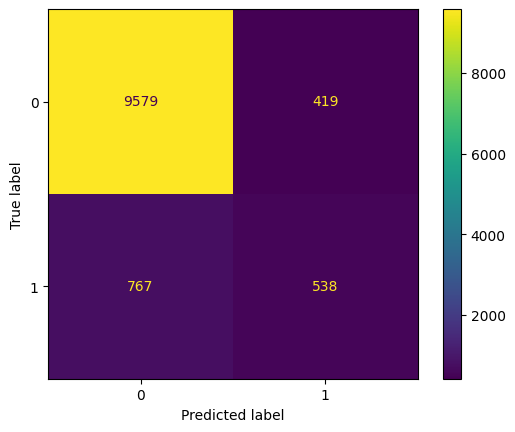

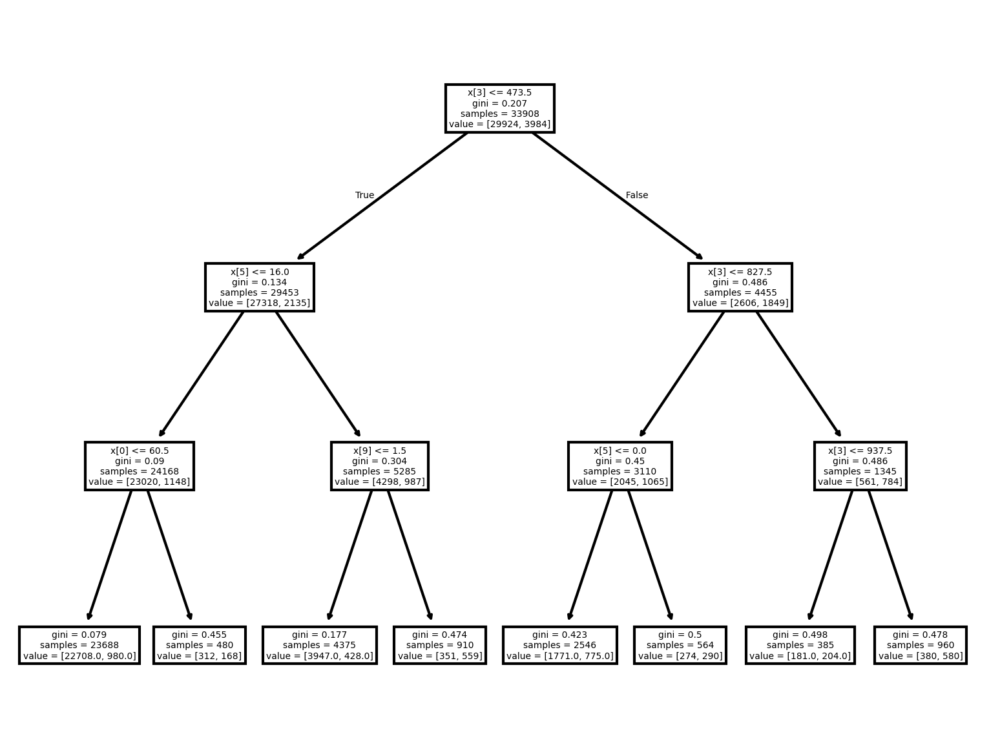

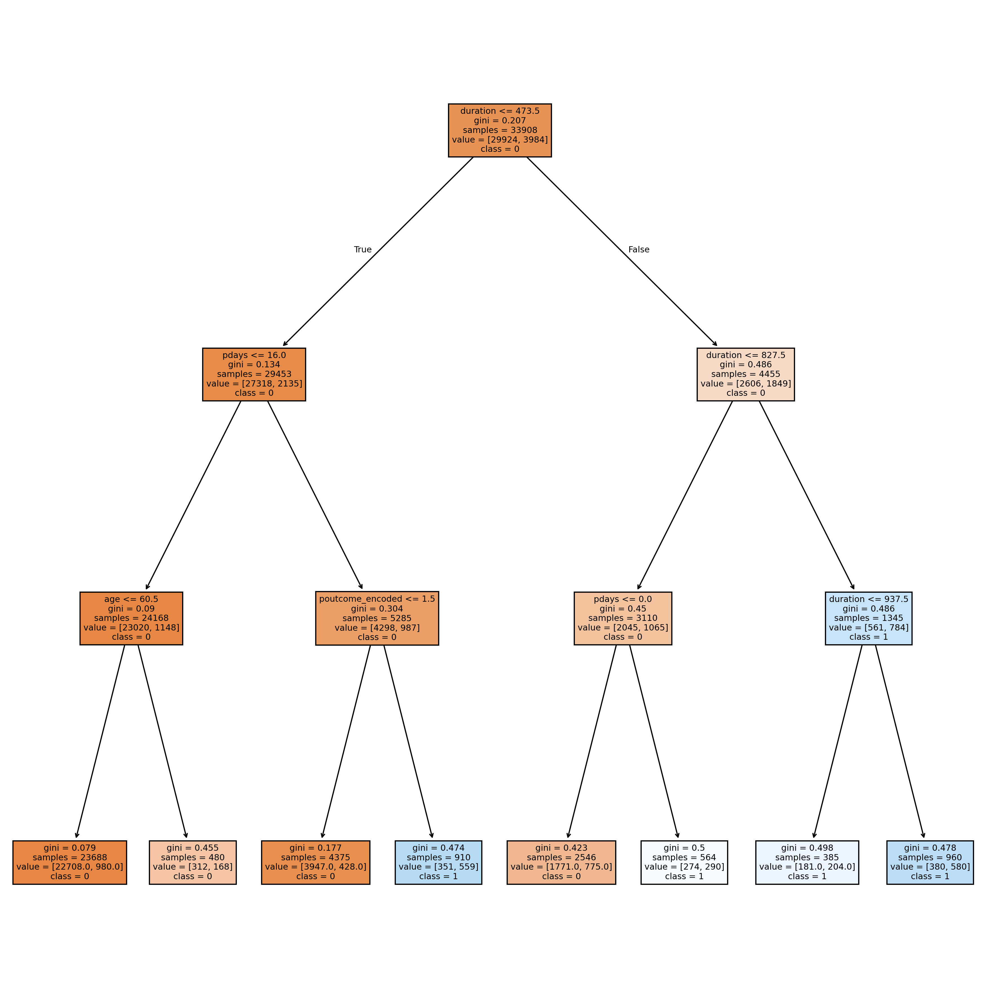

In [11]:
Tree = DecisionTreeClassifier(criterion="gini", max_depth=3)
model = Tree.fit(x_train, y_train)
y_pred = Tree.predict(x_test)


cm = confusion_matrix(y_test, y_pred)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

print("accuracy =", accuracy_score(y_test, y_pred))
# Set high DPI for better resolution
ConfusionMatrixDisplay.from_estimator(model, x_test, y_test)
plt.figure(dpi=300)
tree.plot_tree(model)
plt.show()

fig = plt.figure(figsize=(15, 15),dpi=300)
_ = tree.plot_tree(model, feature_names=x.columns, class_names=['0', '1'], filled=True)

## Random Forest

In [12]:
classifier = RandomForestClassifier(n_estimators=17, criterion='gini', random_state=0)
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)


# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

# Evaluating the Random Forest model
cm = confusion_matrix(y_test, y_pred)
print("accuracy =", accuracy_score(y_test, y_pred))
print(cm)

F1 Score: 0.46846846846846846
accuracy = 0.8956029372732903
[[9603  395]
 [ 785  520]]


## Logistic regression

Accuracy: 0.7930637883747678
F1 Score: 0.4581885568681955


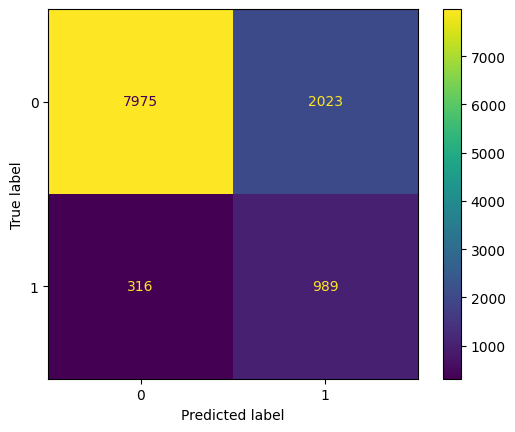

In [13]:
# Train Logistic Regression
LR = LogisticRegression(class_weight='balanced').fit(x_train_scale, y_train)

# Predictions
y_pred = LR.predict(x_test_scale)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)  # Adjust for multi-class if needed

print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(LR, x_test_scale, y_test)


## SVM with Linear Kernel

Accuracy with Linear Kernel: 0.7894
F1 Score: 0.4549


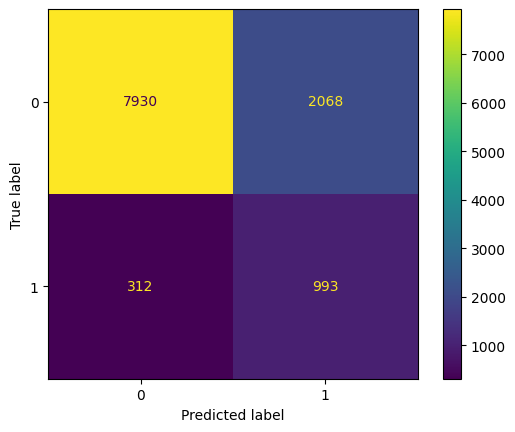

In [14]:
# Use scaled data for SVM
svm_linear = SVC(kernel='linear',C=1,random_state=0, class_weight='balanced')
svm_linear.fit(x_train_scale, y_train)

# Make predictions
y_pred_linear = svm_linear.predict(x_test_scale)

# Evaluate accuracy
accuracy_linear = accuracy_score(y_test, y_pred_linear)
print(f"Accuracy with Linear Kernel: {accuracy_linear:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_linear) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_linear)


## SVM with RBF Kernel

Accuracy with RBF Kernel: 0.8998
F1 Score: 0.3925


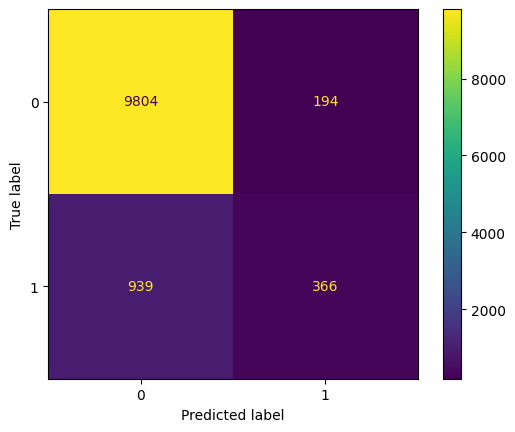

In [15]:
# Create SVM model with RBF kernel
svm_rbf = SVC(kernel='rbf',C=1,gamma='auto', random_state=0)
svm_rbf.fit(x_train_scale, y_train)

# Make predictions on the test set
y_pred_rbf = svm_rbf.predict(x_test_scale)

# Evaluate accuracy
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Accuracy with RBF Kernel: {accuracy_rbf:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_rbf) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rbf)


## MLP (Multi-Layer Perceptron)

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50,), 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'solver': 'adam'}
Best Accuracy: 0.8978
Best F1 Score: 0.4518


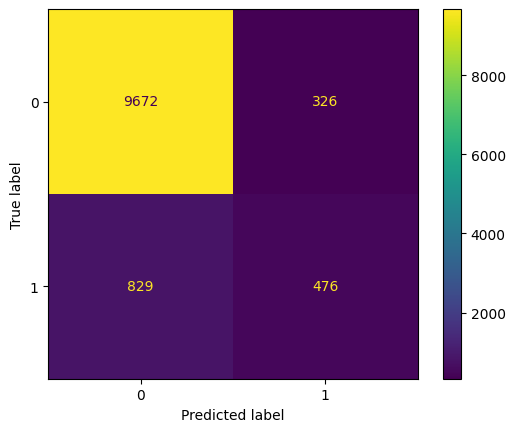

In [16]:
# Define the parameter grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant'],
    'learning_rate_init': [0.001, 0.01]
}

# Initialize the MLPClassifier
mlp = MLPClassifier(max_iter=500, early_stopping=True, validation_fraction=0.1, random_state=0)

# Perform grid search with 3-fold cross-validation
grid_search = GridSearchCV(mlp, param_grid, scoring='f1', cv=3, n_jobs=-1)
grid_search.fit(x_train_scale, y_train)

# Output best parameters and scores
print("Best Parameters:", grid_search.best_params_)

# Train and evaluate the best model
best_mlp = grid_search.best_estimator_
y_pred_best = best_mlp.predict(x_test_scale)

# Calculate accuracy and F1 score for the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

print(f"Best Accuracy: {accuracy_best:.4f}")
print(f"Best F1 Score: {f1_best:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_best)
plt.show()


## After trying SMOTE (Synthetic Minority Over-sampling Technique)

In [17]:
# Initialize SMOTE
smote = SMOTE(random_state=1)

# Apply SMOTE to the training data
x_train_SMOTE, y_train_SMOTE = smote.fit_resample(x_train, y_train)


In [18]:
# Feature Scaling
sc = StandardScaler()
x_train_SMOTE_scale = sc.fit_transform(x_train_SMOTE)
x_test_SMOTE_scale = sc.transform(x_test)

## KNN (SMOTE)

F1 Score: 0.4651924651924652
accuracy =  0.8266831814562505


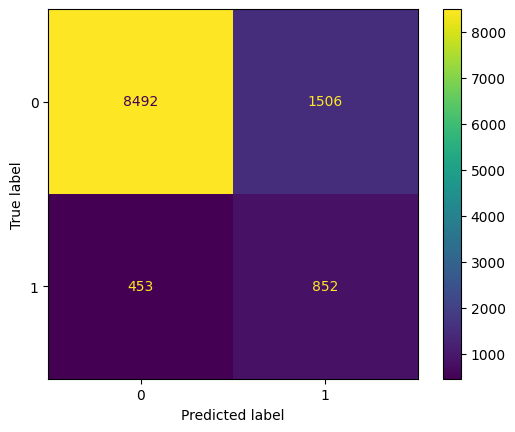

In [19]:
# Training the K-NN model on the Training set
KNN_classifier = KNeighborsClassifier(n_neighbors=12, metric='minkowski', p=2)
KNN_classifier.fit(x_train_SMOTE_scale, y_train_SMOTE)

# Predicting the Test set results
y_pred = KNN_classifier.predict(x_test_SMOTE_scale)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)


# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("accuracy = ", accuracy_score(y_test, y_pred))


# Displaying the Confusion Matrix
ConfusionMatrixDisplay.from_estimator(KNN_classifier, x_test_SMOTE_scale, y_test)
plt.show()



## Decision tree (SMOTE)

F1 Score: 0.4687058823529412
accuracy = 0.800230027426347


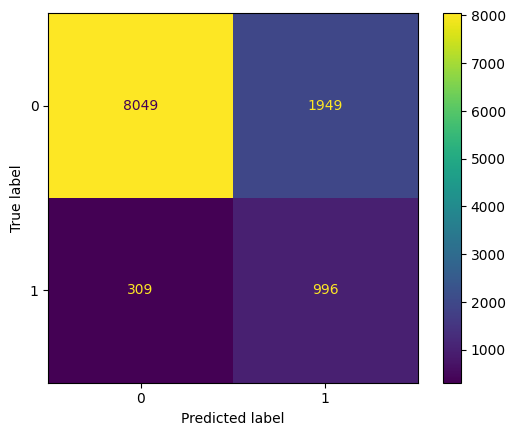

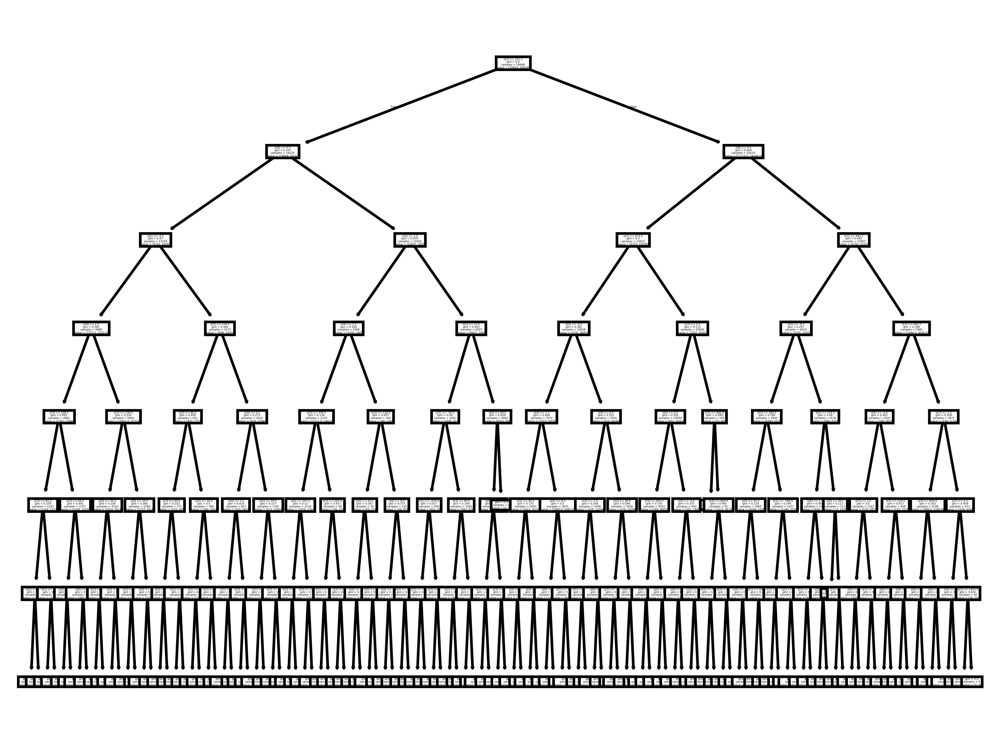

In [20]:
Tree = DecisionTreeClassifier(criterion="gini", max_depth=7)
model = Tree.fit(x_train_SMOTE, y_train_SMOTE)
y_pred = Tree.predict(x_test)


cm = confusion_matrix(y_test, y_pred)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

print("accuracy =", accuracy_score(y_test, y_pred))
# Set high DPI for better resolution
ConfusionMatrixDisplay.from_estimator(model, x_test, y_test)
plt.figure(dpi=800)
tree.plot_tree(model)
plt.show()

fig = plt.figure(figsize=(15, 15),dpi=800)
_ = tree.plot_tree(model, feature_names=x.columns, class_names=['0', '1'], filled=True)

## Random Forest (SMOTE)

In [21]:
classifier = RandomForestClassifier(n_estimators=20, criterion='gini', random_state=0)
classifier.fit(x_train_SMOTE, y_train_SMOTE)
y_pred = classifier.predict(x_test)


# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

# Evaluating the Random Forest model
cm = confusion_matrix(y_test, y_pred)
print("accuracy =", accuracy_score(y_test, y_pred))
print(cm)

F1 Score: 0.49876390605686033
accuracy = 0.8564982747943024
[[8874 1124]
 [ 498  807]]


## Logistic Regression (SMOTE)

Accuracy: 0.7982836415111032
F1 Score: 0.4444444444444444


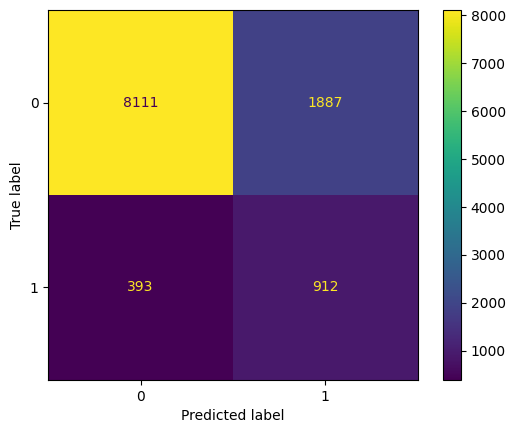

In [22]:
LR = LogisticRegression().fit(x_train_SMOTE_scale,y_train_SMOTE)

# Predict class labels for the test set
y_pred = LR.predict(x_test_SMOTE_scale)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)



Y = LogisticRegression().fit(x_train_SMOTE_scale, y_train_SMOTE)
ConfusionMatrixDisplay.from_estimator(Y, x_test_SMOTE_scale, y_test)


## SVM with linear kernel (SMOTE)

Accuracy with Linear Kernel: 0.7909
F1 Score: 0.4427


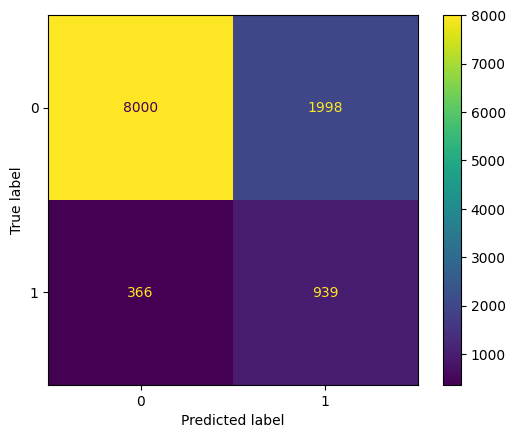

In [23]:
# Use scaled data for SVM
svm_linear = SVC(kernel='linear',C=1,gamma='auto' ,random_state=0)
svm_linear.fit(x_train_SMOTE_scale, y_train_SMOTE)

# Make predictions
y_pred_linear = svm_linear.predict(x_test_SMOTE_scale)

# Evaluate accuracy
accuracy_linear = accuracy_score(y_test, y_pred_linear)
print(f"Accuracy with Linear Kernel: {accuracy_linear:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_linear) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_linear)


## SVM with RBF kernel

Accuracy with RBF Kernel: 0.8157
F1 Score: 0.4770


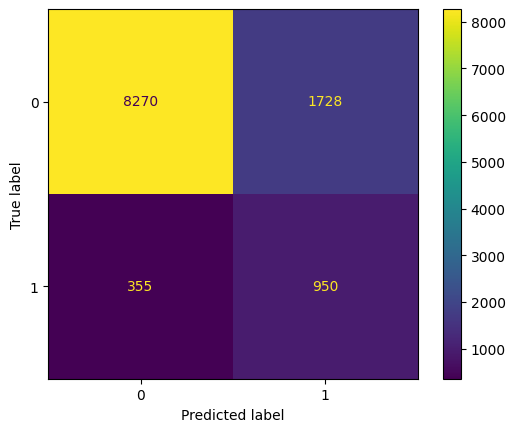

In [24]:
# Create SVM model with RBF kernel
svm_rbf = SVC(kernel='rbf',C=1,gamma='auto', random_state=0)
svm_rbf.fit(x_train_SMOTE_scale, y_train_SMOTE)

# Make predictions on the test set
y_pred_rbf = svm_rbf.predict(x_test_SMOTE_scale)

# Evaluate accuracy
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Accuracy with RBF Kernel: {accuracy_rbf:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_rbf) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rbf)

## MLP (SMOTE)

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'solver': 'adam'}
Best Accuracy: 0.8193
Best F1 Score: 0.4860


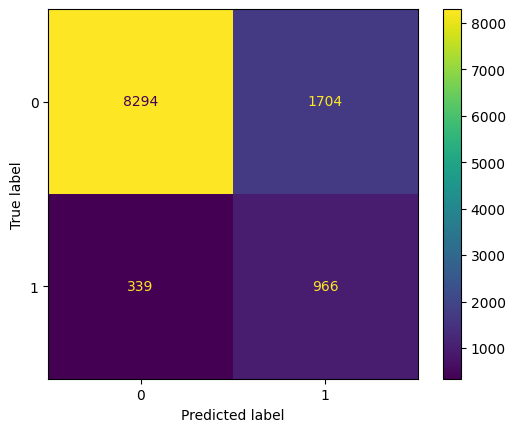

In [25]:
# Define the parameter grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant'],
    'learning_rate_init': [0.001, 0.01,0.1]
}

# Initialize the MLPClassifier
mlp = MLPClassifier(max_iter=500, early_stopping=True, validation_fraction=0.1, random_state=0)

# Perform grid search with 3-fold cross-validation
grid_search = GridSearchCV(mlp, param_grid, scoring='f1', n_jobs=-1)
grid_search.fit(x_train_SMOTE_scale, y_train_SMOTE)

# Output best parameters and scores
print("Best Parameters:", grid_search.best_params_)

# Train and evaluate the best model
best_mlp = grid_search.best_estimator_
y_pred_best = best_mlp.predict(x_test_SMOTE_scale)

# Calculate accuracy and F1 score for the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

print(f"Best Accuracy: {accuracy_best:.4f}")
print(f"Best F1 Score: {f1_best:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_best)
plt.show()


## After trying Undersampling

In [26]:
# Initialize undersampler
undersampler = RandomUnderSampler(random_state=1)

# Apply undersampling to training data
x_train_resampled, y_train_resampled = undersampler.fit_resample(x_train, y_train)

# Check class distribution after undersampling
print("Class distribution after undersampling:", Counter(y_train_resampled))


Class distribution after undersampling: Counter({0: 3984, 1: 3984})


In [27]:
# Feature Scaling
sc = StandardScaler()
x_train_resampled_scale = sc.fit_transform(x_train_resampled)
x_test_resampled_scale = sc.transform(x_test)

## KNN (UnderSampling)

F1 Score: 0.4297132110954396
Accuracy: 0.7853667168008494


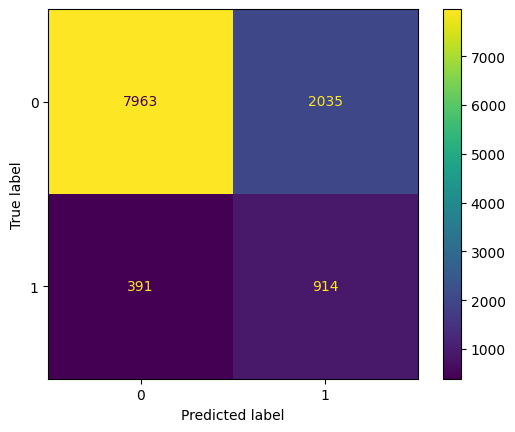

In [28]:
# Train KNN model
knn = KNeighborsClassifier(n_neighbors=8, metric='minkowski', p=2)
knn.fit(x_train_resampled, y_train_resampled)

# Predict on the test set
y_pred = knn.predict(x_test)

# Evaluate model
f1 = f1_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

print("F1 Score:", f1)
print("Accuracy:", accuracy)

# Display confusion matrix
ConfusionMatrixDisplay.from_estimator(knn, x_test, y_test)
plt.show()


## Decision Tree (Undersampling)

F1 Score: 0.477896168669236
accuracy = 0.796248783508803


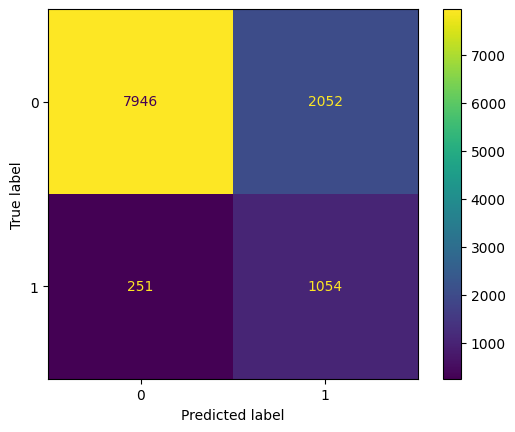

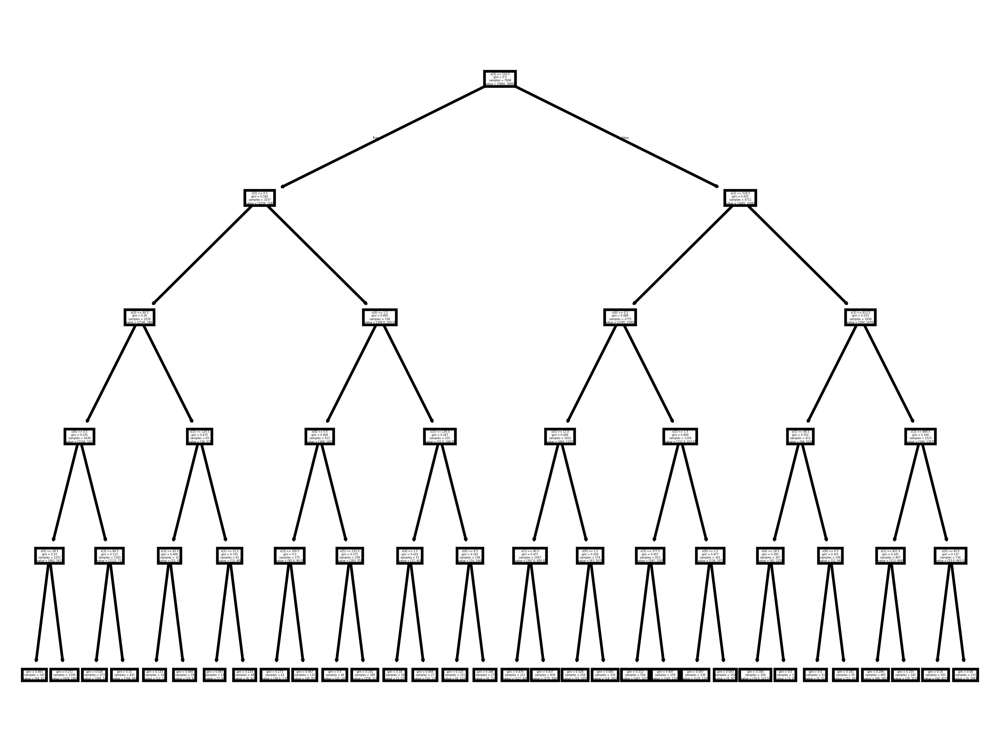

In [29]:
Tree = DecisionTreeClassifier(criterion="gini", max_depth=5)
model = Tree.fit(x_train_resampled, y_train_resampled)
y_pred = Tree.predict(x_test)


cm = confusion_matrix(y_test, y_pred)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

print("accuracy =", accuracy_score(y_test, y_pred))
# Set high DPI for better resolution
ConfusionMatrixDisplay.from_estimator(model, x_test, y_test)
plt.figure(dpi=600)
tree.plot_tree(model)
plt.show()

fig = plt.figure(figsize=(15, 15),dpi=600)
_ = tree.plot_tree(model, feature_names=x.columns, class_names=['0', '1'], filled=True)

## Random Forest (Undersampling)

In [30]:
classifier = RandomForestClassifier(n_estimators = 24, criterion='gini', random_state=0)
classifier.fit(x_train_resampled, y_train_resampled)
y_pred = classifier.predict(x_test)


# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

# Evaluating the Random Forest model
cm = confusion_matrix(y_test, y_pred)
print("accuracy =", accuracy_score(y_test, y_pred))
print(cm)

F1 Score: 0.5002333177788147
accuracy = 0.8104927895249049
[[8089 1909]
 [ 233 1072]]


## Logistic Regression (Undersampling)

Accuracy: 0.7946562859417854
F1 Score: 0.4588482163674516


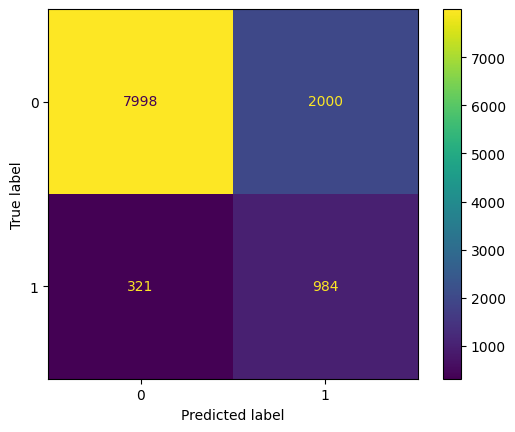

In [31]:
LR = LogisticRegression().fit(x_train_resampled_scale,y_train_resampled)

# Predict class labels for the test set
y_pred = LR.predict(x_test_resampled_scale)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)



Y = LogisticRegression().fit(x_train_resampled_scale, y_train_resampled)
ConfusionMatrixDisplay.from_estimator(Y, x_test_resampled_scale, y_test)


## SVM with linear kernel (undersampling)

Accuracy with Linear Kernel: 0.7925
F1 Score: 0.4571


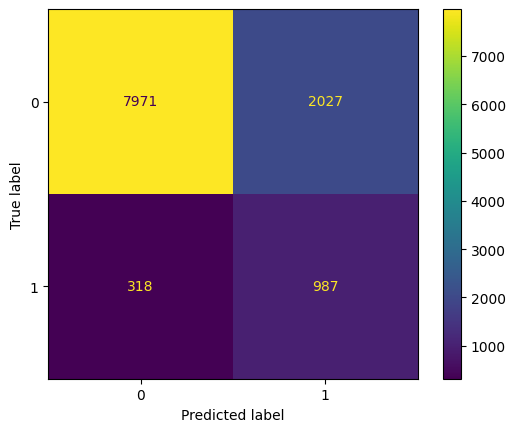

In [32]:
# Use scaled data for SVM
svm_linear = SVC(kernel='linear',C=1,gamma='auto' ,random_state=0)
svm_linear.fit(x_train_resampled_scale, y_train_resampled)

# Make predictions
y_pred_linear = svm_linear.predict(x_test_resampled_scale)

# Evaluate accuracy
accuracy_linear = accuracy_score(y_test, y_pred_linear)
print(f"Accuracy with Linear Kernel: {accuracy_linear:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_linear) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_linear)


## SVM with RBF kernel (undersampling)

Accuracy with RBF Kernel: 0.7962
F1 Score: 0.4839


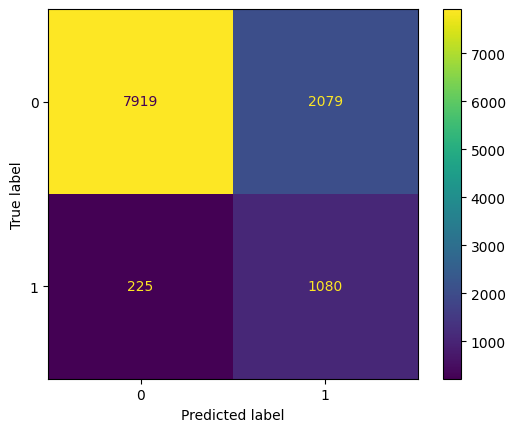

In [33]:
# Create SVM model with RBF kernel
svm_rbf = SVC(kernel='rbf',C=1,gamma='auto', random_state=0)
svm_rbf.fit(x_train_resampled_scale, y_train_resampled)

# Make predictions on the test set
y_pred_rbf = svm_rbf.predict(x_test_resampled_scale)

# Evaluate accuracy
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Accuracy with RBF Kernel: {accuracy_rbf:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_rbf) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rbf)

## MLP (undersampling)

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'solver': 'adam'}
Best Accuracy: 0.7993
Best F1 Score: 0.4855


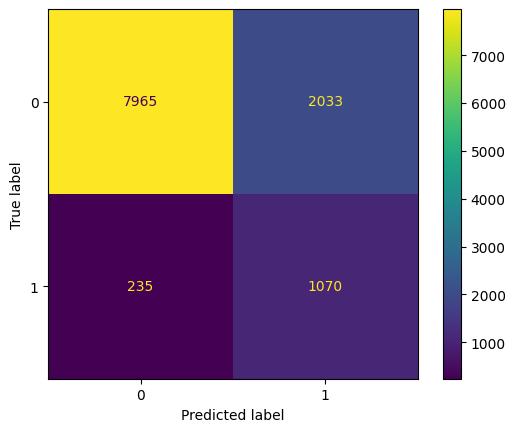

In [34]:
# Define the parameter grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant'],
    'learning_rate_init': [0.001, 0.01]
}

# Initialize the MLPClassifier
mlp = MLPClassifier(max_iter=500, early_stopping=True, validation_fraction=0.1, random_state=0)

# Perform grid search with 3-fold cross-validation
grid_search = GridSearchCV(mlp, param_grid, scoring='f1', cv=3, n_jobs=-1)
grid_search.fit(x_train_resampled_scale, y_train_resampled)

# Output best parameters and scores
print("Best Parameters:", grid_search.best_params_)

# Train and evaluate the best model
best_mlp = grid_search.best_estimator_
y_pred_best = best_mlp.predict(x_test_resampled_scale)

# Calculate accuracy and F1 score for the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

print(f"Best Accuracy: {accuracy_best:.4f}")
print(f"Best F1 Score: {f1_best:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_best)
plt.show()


## After trying ADASYN

In [35]:
adasyn = ADASYN(random_state=1)
x_train_adasyn, y_train_adasyn = adasyn.fit_resample(x_train, y_train)


In [36]:
# Feature Scaling
sc = StandardScaler()
x_train_adasyn_scale = sc.fit_transform(x_train_adasyn)
x_test_adasyn_scale = sc.transform(x_test)

## KNN (ADASYN)

F1 Score: 0.4533260333972078
accuracy =  0.8233212421481023


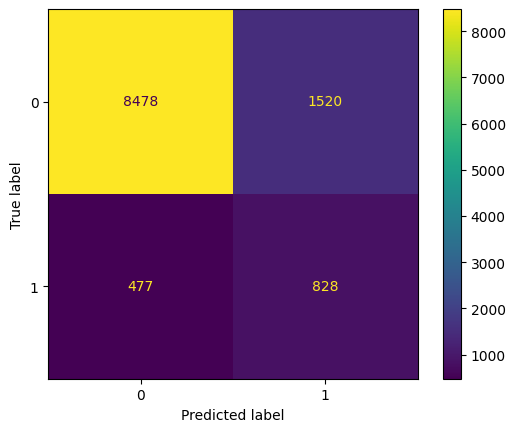

In [37]:
# Training the K-NN model on the Training set
KNN_classifier = KNeighborsClassifier(n_neighbors=6, metric='minkowski', p=2)
KNN_classifier.fit(x_train_adasyn_scale, y_train_adasyn)

# Predicting the Test set results
y_pred = KNN_classifier.predict(x_test_adasyn_scale)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)


# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("accuracy = ", accuracy_score(y_test, y_pred))


# Displaying the Confusion Matrix
ConfusionMatrixDisplay.from_estimator(KNN_classifier, x_test_adasyn_scale, y_test)
plt.show()




## Decision Tree (ADASYN)

F1 Score: 0.4507715713975223
accuracy = 0.7764310360081395


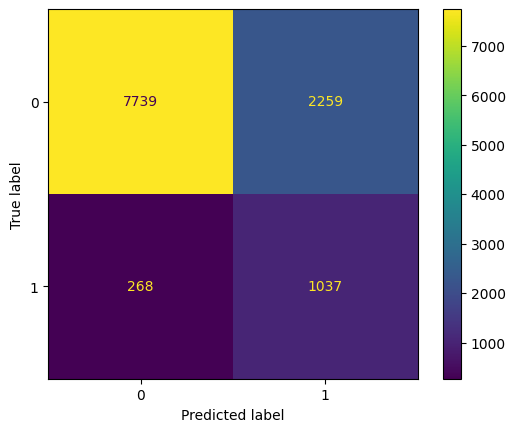

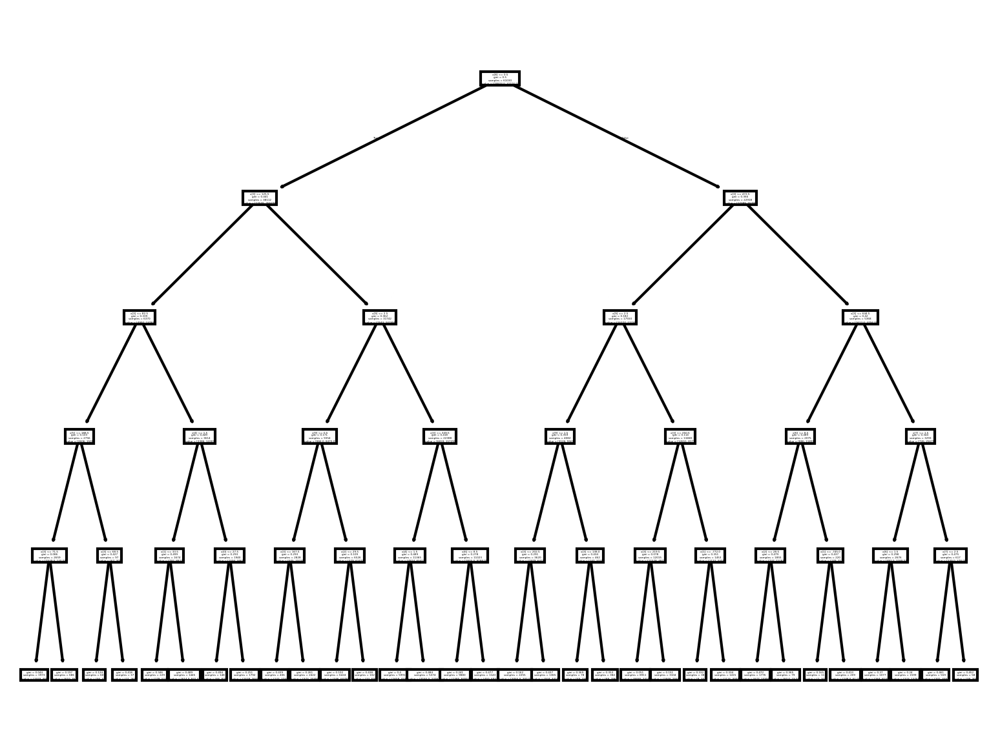

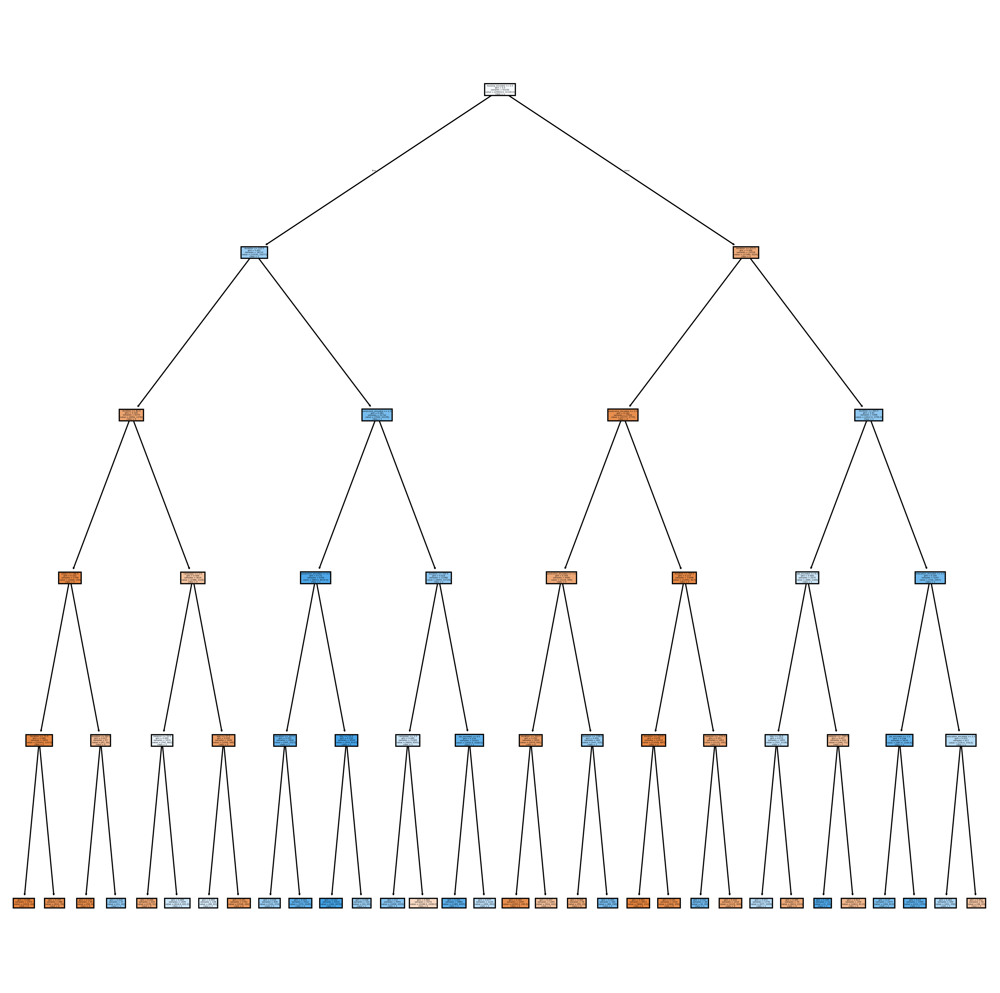

In [38]:
Tree = DecisionTreeClassifier(criterion="gini", max_depth=5)
model = Tree.fit(x_train_adasyn, y_train_adasyn)
y_pred = Tree.predict(x_test)


cm = confusion_matrix(y_test, y_pred)

# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

print("accuracy =", accuracy_score(y_test, y_pred))
# Set high DPI for better resolution
ConfusionMatrixDisplay.from_estimator(model, x_test, y_test)
plt.figure(dpi=300)
tree.plot_tree(model)
plt.show()

fig = plt.figure(figsize=(15, 15),dpi=300)
_ = tree.plot_tree(model, feature_names=x.columns, class_names=['0', '1'], filled=True)

## Random Forest

In [39]:
classifier = RandomForestClassifier(n_estimators=17, criterion='gini', random_state=0)
classifier.fit(x_train_adasyn, y_train_adasyn)
y_pred = classifier.predict(x_test)


# Calculating F1 Score
f1 = f1_score(y_test, y_pred) 
print("F1 Score:", f1)

# Evaluating the Random Forest model
cm = confusion_matrix(y_test, y_pred)
print(cm)
print("accuracy =", accuracy_score(y_test, y_pred))

F1 Score: 0.4928856004553216
[[8655 1343]
 [ 439  866]]
accuracy = 0.842342740865257


## Logistic Regression (ADASYN)

Accuracy: 0.7748385384411218
F1 Score: 0.42693087142535463


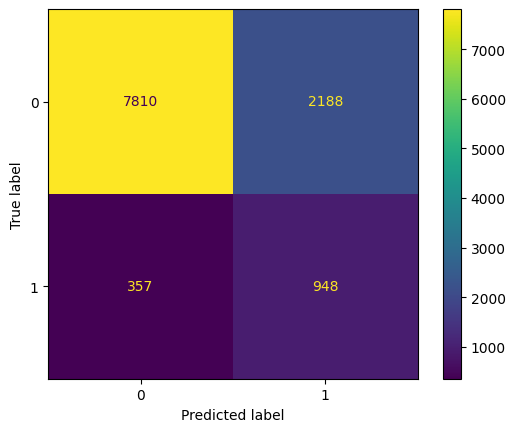

In [40]:
# Train Logistic Regression
LR = LogisticRegression(class_weight='balanced').fit(x_train_adasyn_scale, y_train_adasyn)

# Predictions
y_pred = LR.predict(x_test_adasyn_scale)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)  # Adjust for multi-class if needed

print("Accuracy:", accuracy)
print("F1 Score:", f1)

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(LR, x_test_adasyn_scale, y_test)


## SVM with linear kernel (ADASYN)

Accuracy with Linear Kernel: 0.7386
F1 Score: 0.4053


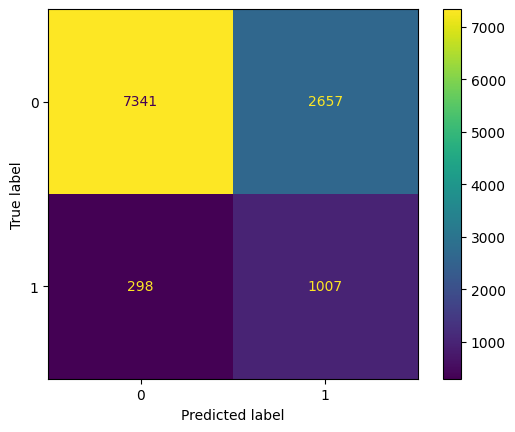

In [41]:
# Use scaled data for SVM
svm_linear = SVC(kernel='linear',C=1,gamma='auto' ,random_state=0)
svm_linear.fit(x_train_adasyn_scale, y_train_adasyn)

# Make predictions
y_pred_linear = svm_linear.predict(x_test_adasyn_scale)

# Evaluate accuracy
accuracy_linear = accuracy_score(y_test, y_pred_linear)
print(f"Accuracy with Linear Kernel: {accuracy_linear:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_linear) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_linear)


## SVM with RBF kernel (ADASYN)

Accuracy with RBF Kernel: 0.7953
F1 Score: 0.4583


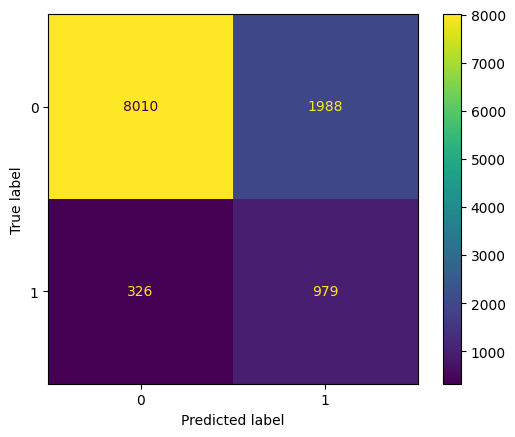

In [42]:
# Create SVM model with RBF kernel
svm_rbf = SVC(kernel='rbf',C=1,gamma='auto', random_state=0)
svm_rbf.fit(x_train_adasyn_scale, y_train_adasyn)

# Make predictions on the test set
y_pred_rbf = svm_rbf.predict(x_test_adasyn_scale)

# Evaluate accuracy
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Accuracy with RBF Kernel: {accuracy_rbf:.4f}")

# Calculating F1 Score
f1 = f1_score(y_test, y_pred_rbf) 
print(f"F1 Score: {f1:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rbf)


## MLP (ADASYN)

Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'solver': 'adam'}
Best Accuracy: 0.7973
Best F1 Score: 0.4681


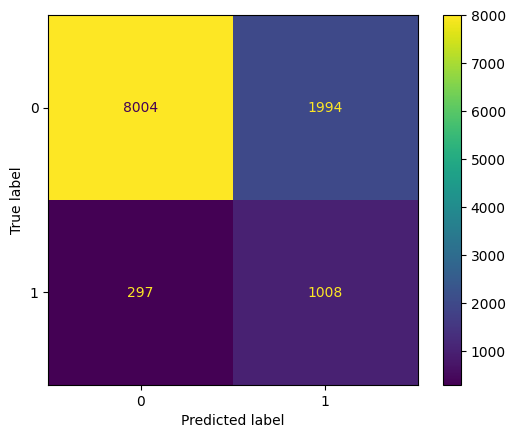

In [43]:
# Define the parameter grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant'],
    'learning_rate_init': [0.001, 0.01]
}

# Initialize the MLPClassifier
mlp = MLPClassifier(max_iter=500, early_stopping=True, validation_fraction=0.1, random_state=0)

# Perform grid search with 3-fold cross-validation
grid_search = GridSearchCV(mlp, param_grid, scoring='f1', cv=3, n_jobs=-1)
grid_search.fit(x_train_adasyn_scale, y_train_adasyn)

# Output best parameters and scores
print("Best Parameters:", grid_search.best_params_)

# Train and evaluate the best model
best_mlp = grid_search.best_estimator_
y_pred_best = best_mlp.predict(x_test_adasyn_scale)

# Calculate accuracy and F1 score for the best model
accuracy_best = accuracy_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

print(f"Best Accuracy: {accuracy_best:.4f}")
print(f"Best F1 Score: {f1_best:.4f}")

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_best)
plt.show()


## Metrics
![My Image](normal.png)

## Metrics for SMOTE
![My Image](Smote.png)


## Metrics for Undersampling
![My Image](undersampling.png)


## Metrics for ADASYN
![My Image](adasyn.png)
